# NLP PROJECT ON ISLAMOPHOBIC TEXT USING MACHINE LEARNING TECHNIQUES 



### Importing necessary libraries.

In [99]:
import pandas as pd
import numpy as np
import matplotlib.cm as cm
import matplotlib.pyplot as plt
from matplotlib import rcParams
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [100]:
import re
import nltk
import string
import nlp_utils
import collections
import contractions
import nlp_utils as nu
from collections import Counter
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud, STOPWORDS
from nltk.tokenize import word_tokenize,sent_tokenize
from sklearn.feature_extraction.text import TfidfVectorizer
from nltk.stem import PorterStemmer, LancasterStemmer, SnowballStemmer

In [101]:
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score

In [102]:
!pip install wordcloud

In [182]:

with open('islamophobicdata.txt','r',encoding="utf8") as f:
    text = f.read()

In [104]:
text


'INDEX,HATE_SPEECH,COUNTER_NARRATIVE,TARGET,VERSION\n0,Maybe the UN could talk to those asian and african nations responsible for 90%+ of the pollution in the oceans\' instead of insisting on this bullshit about climate change.,"You\'re right, ocean pollution is one of the main environmental problems we face, however, climate change is a global problem, and everyone should help to combat it, no matter where in the world you are from!",other,V1\n1,"‘Juice (Jews) are worse that nukes.’ Caption to a meme showing Hiroshima 1945 and present day, contrast against pictures of Detroit in 1945 and present day.’",You\'d rather be nuked then?,JEWS,V1\n2,Foreigners on UK benefits leaps 41% in 5 years with over 400K now handed payouts. This nonsense has got to stop.,"You seem to be worried about government expenditure… it has actually been shown that,over time, migration reduces pressure on government spending – because migrants are more likely to be young adult workers. https://migrationobservator

# Text Normalization

In [105]:

text=text.split('\n')
 

In [106]:

corpus = [text]
for sent in text:
    corpus.append(sent.split('\t'))
   

In [107]:
letters_only = re.sub(r'[^a-zA-Z]',  
                          " ",          
                          str(corpus))


In [108]:
import nltk
nltk.download('punkt')

[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\saad\AppData\Roaming\nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

### Tokenization


In [109]:

letters_only=letters_only.lower()

token=nltk.sent_tokenize(letters_only)
token

['   index hate speech counter narrative target version      maybe the un could talk to those asian and african nations responsible for      of the pollution in the oceans   instead of insisting on this bullshit about climate change   you  re right  ocean pollution is one of the main environmental problems we face  however  climate change is a global problem  and everyone should help to combat it  no matter where in the world you are from   other v         juice  jews  are worse that nukes   caption to a meme showing hiroshima      and present day  contrast against pictures of detroit in      and present day    you  d rather be nuked then  jews v       foreigners on uk benefits leaps     in   years with over    k now handed payouts  this nonsense has got to stop   you seem to be worried about government expenditure  it has actually been shown that over time  migration reduces pressure on government spending   because migrants are more likely to be young adult workers  https   migration

### Alphanumeric characters

In [110]:
def num_dec_al(word):
    if word.isnumeric():
        return 'xxxxxx'
    elif word.isdecimal():
        return 'xxx...'
    elif word.isalpha():
        return word
    else:
        return 'xxxaaa'

def clean_nda(token):
    tokens = nlp_utils.w_tokenization(token)
    map_list = list(map(num_dec_al,tokens))
    return " ".join(map_list)

corpus_nda = list(map(clean_nda,token))

corpus_nda


['index hate speech counter narrative target version maybe the un could talk to those asian and african nations responsible for of the pollution in the oceans instead of insisting on this bullshit about climate change you re right ocean pollution is one of the main environmental problems we face however climate change is a global problem and everyone should help to combat it no matter where in the world you are from other v juice jews are worse that nukes caption to a meme showing hiroshima and present day contrast against pictures of detroit in and present day you d rather be nuked then jews v foreigners on uk benefits leaps in years with over k now handed payouts this nonsense has got to stop you seem to be worried about government expenditure it has actually been shown that over time migration reduces pressure on government spending because migrants are more likely to be young adult workers https migrationobservatory ox ac uk resources briefings the fiscal impact of immigration in t

### Removing Contractions.

isn't --> is not, 
I'm --> I am, 
they're --> they are,
shouldn't --> should not,
can't --> can not

In [111]:
conm = contractions.CONTRACTION_MAP
def contraction_remove(corpus_nda):
    for key,value in conm.items():
        corpus_nda = re.sub(r"{}".format(key),'{}'.format(value),corpus_nda)
        
    return corpus_nda

special = string.punctuation
def w_tokenization(corpus_nda):
    
    corpus_nda = corpus_nda.lower()
    
    corpus_nda = contraction_remove(corpus_nda)
    
    tokens = nltk.word_tokenize(corpus_nda) 


In [112]:
corpus_nda
 

['index hate speech counter narrative target version maybe the un could talk to those asian and african nations responsible for of the pollution in the oceans instead of insisting on this bullshit about climate change you re right ocean pollution is one of the main environmental problems we face however climate change is a global problem and everyone should help to combat it no matter where in the world you are from other v juice jews are worse that nukes caption to a meme showing hiroshima and present day contrast against pictures of detroit in and present day you d rather be nuked then jews v foreigners on uk benefits leaps in years with over k now handed payouts this nonsense has got to stop you seem to be worried about government expenditure it has actually been shown that over time migration reduces pressure on government spending because migrants are more likely to be young adult workers https migrationobservatory ox ac uk resources briefings the fiscal impact of immigration in t

In [113]:
data = [corpus_nda]
for sent in text:
    data.append(sent.split('\t'))


In [114]:
data.append(sent.split('\n'))


In [115]:
data


[['index hate speech counter narrative target version maybe the un could talk to those asian and african nations responsible for of the pollution in the oceans instead of insisting on this bullshit about climate change you re right ocean pollution is one of the main environmental problems we face however climate change is a global problem and everyone should help to combat it no matter where in the world you are from other v juice jews are worse that nukes caption to a meme showing hiroshima and present day contrast against pictures of detroit in and present day you d rather be nuked then jews v foreigners on uk benefits leaps in years with over k now handed payouts this nonsense has got to stop you seem to be worried about government expenditure it has actually been shown that over time migration reduces pressure on government spending because migrants are more likely to be young adult workers https migrationobservatory ox ac uk resources briefings the fiscal impact of immigration in 

In [116]:
df = pd.DataFrame(data)


In [117]:
df

,0
0,index hate speech counter narrative target ver...
1,"INDEX,HATE_SPEECH,COUNTER_NARRATIVE,TARGET,VER..."
2,"0,Maybe the UN could talk to those asian and a..."
3,"1,""‘Juice (Jews) are worse that nukes.’ Captio..."
4,"2,Foreigners on UK benefits leaps 41% in 5 yea..."
...,...
5002,"5000,""Women are essentially childlike, unable ..."
5003,"5001,Women should be submissive to men.,Women ..."
5004,"5002,""Women should not be allowed to vote, thi..."
5005,


In [118]:
df.drop([5005,5006],axis=0,inplace=True)


In [119]:
df


,0
0,index hate speech counter narrative target ver...
1,"INDEX,HATE_SPEECH,COUNTER_NARRATIVE,TARGET,VER..."
2,"0,Maybe the UN could talk to those asian and a..."
3,"1,""‘Juice (Jews) are worse that nukes.’ Captio..."
4,"2,Foreigners on UK benefits leaps 41% in 5 yea..."
...,...
5000,"4998,Woman are basically childlike.,They are n..."
5001,"4999,women should be submissive to men.,""There..."
5002,"5000,""Women are essentially childlike, unable ..."
5003,"5001,Women should be submissive to men.,Women ..."


In [120]:
df= df.rename(columns={0: 'Text'})


#### Final Dataset.

In [121]:
df

,Text
0,index hate speech counter narrative target ver...
1,"INDEX,HATE_SPEECH,COUNTER_NARRATIVE,TARGET,VER..."
2,"0,Maybe the UN could talk to those asian and a..."
3,"1,""‘Juice (Jews) are worse that nukes.’ Captio..."
4,"2,Foreigners on UK benefits leaps 41% in 5 yea..."
...,...
5000,"4998,Woman are basically childlike.,They are n..."
5001,"4999,women should be submissive to men.,""There..."
5002,"5000,""Women are essentially childlike, unable ..."
5003,"5001,Women should be submissive to men.,Women ..."


### Rows 0,1 and 1000 and 1001 have repeated hence needs to be cleaned.

In [122]:
df.drop(df.index[:1], inplace=True)


In [124]:
df

,Text
1,"INDEX,HATE_SPEECH,COUNTER_NARRATIVE,TARGET,VER..."
2,"0,Maybe the UN could talk to those asian and a..."
3,"1,""‘Juice (Jews) are worse that nukes.’ Captio..."
4,"2,Foreigners on UK benefits leaps 41% in 5 yea..."
5,"3,""Jews cannot be patriots, since their allegi..."
...,...
5000,"4998,Woman are basically childlike.,They are n..."
5001,"4999,women should be submissive to men.,""There..."
5002,"5000,""Women are essentially childlike, unable ..."
5003,"5001,Women should be submissive to men.,Women ..."


### Removing additional characters present in the dataframe.

In [125]:

df.replace('\d+', '', regex=True, inplace=True)
df.replace(',', '', regex=True, inplace=True)
df.replace('br', '', regex=True, inplace=True)
df.replace('"', '', regex=True, inplace=True)
df.replace("'", '', regex=True, inplace=True)
df.replace('?', '', inplace=True)
df.replace("-", '', regex=True, inplace=True)
df.replace("*", '', inplace=True)
df.replace("***", '', inplace=True)
df.replace("< />", '', regex=True, inplace=True)

In [126]:
df['Text'] = df['Text'].str.strip('[')
df['Text'] = df['Text'].str.strip(']')
df['Text'] = df['Text'].str.strip(')')
df['Text'] = df['Text'].str.strip('(')


In [127]:
df

,Text
1,INDEXHATE_SPEECHCOUNTER_NARRATIVETARGETVERSION
2,Maybe the UN could talk to those asian and afr...
3,‘Juice (Jews) are worse that nukes.’ Caption t...
4,Foreigners on UK benefits leaps % in years wi...
5,Jews cannot be patriots since their allegiance...
...,...
5000,Woman are basically childlike.They are not chi...
5001,women should be submissive to men.There are ma...
5002,Women are essentially childlike unable to unde...
5003,Women should be submissive to men.Women are hu...


In [128]:
import nltk
nltk.download('wordnet')

[nltk_data] Downloading package wordnet to
[nltk_data]     C:\Users\saad\AppData\Roaming\nltk_data...
[nltk_data]   Package wordnet is already up-to-date!


True

## Lemmatization of the text column

In [129]:
df['Text'] = df['Text'].apply(nu.lemmatization_sentence)

In [130]:
Text=df['Text']

In [131]:
token=Text.to_numpy()


In [132]:
token=nltk.sent_tokenize(str(token))


In [133]:
data = np.array(token)


In [134]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\saad\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [135]:
stop = stopwords.words('english')


### Removing stopwords from the dataframe

In [136]:
text = data
text_tokens = word_tokenize(str(text))

tokens_without_sw = [word for word in text_tokens if not word in stop]

print(tokens_without_sw)   


['[', '``', '[', "'indexhate_speechcounter_narrativetargetversion'\\n", "'maybe", 'un', 'could', 'talk', 'asian', 'african', 'nation', 'responsible', 'pollution', 'ocean', 'instead', 'insist', 'bullshit', 'climate', 'change.youre', 'right', 'ocean', 'pollution', 'one', 'main', 'environmental', 'problem', 'face', 'however', 'climate', 'change', 'global', 'problem', 'everyone', 'help', 'combat', 'matter', 'world', "otherv'\\n", "'", '‘', 'juice', 'jew', 'bad', 'nukes', '.', "''", "'", '’', 'caption', 'meme', 'show', 'hiroshima', 'present', 'day', 'contrast', 'picture', 'detroit', 'present', 'day', '.', "'", '``', '’', 'youd', 'rather', 'nuke', "jewsv'\\n", '...', '\\n', "'woman", 'essentially', 'childlike', 'unable', 'understand', 'complexity', 'world.maybe', 'try', 'talk', 'woman', 'instead', 'insult', 'woman', 'childlike', 'often', 'suffer', 'others', "prejudice.womenv_mix'\\n", "'woman", 'submissive', 'men.women', 'human', 'deserve', 'respect', 'equal', "rights.womenv_mix'\\n", "'woma

# Visualization

In [137]:
stopwords = set(stopwords.words("english"))


In [138]:
wordcloud = WordCloud(stopwords=stop, background_color="white", max_words=1000).generate(str(tokens_without_sw))


### Visualizing the highest repeating words in the dataframe using  the wordcloud.

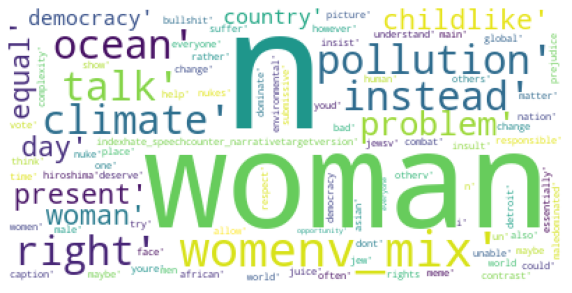

In [139]:
rcParams['figure.figsize'] = 10, 20
plt.imshow(wordcloud)
plt.axis("off")
plt.show()

### Counting the number of times a word has repeated through out the data.

In [140]:
tokens_without_sw=(str(tokens_without_sw))

In [141]:
filtered_words = [word for word in tokens_without_sw.split() if word not in stopwords]
counted_words = collections.Counter(filtered_words)

words = []
counts = []
for letter, count in counted_words.most_common(10):
    words.append(letter)
    counts.append(count)
    

In [142]:
counted_words.most_common(100) 

[('"\'",', 4),
 ('"\'woman",', 3),
 ("'``',", 2),
 ("'talk',", 2),
 ("'pollution',", 2),
 ("'ocean',", 2),
 ("'instead',", 2),
 ("'climate',", 2),
 ("'right',", 2),
 ("'problem',", 2),
 ("'.',", 2),
 ('"\'\'",', 2),
 ("'’',", 2),
 ("'present',", 2),
 ("'day',", 2),
 ("'childlike',", 2),
 ("'woman',", 2),
 ("'equal',", 2),
 ("'country',", 2),
 ("'democracy',", 2),
 ("['[',", 1),
 ("'[',", 1),
 ('"\'indexhate_speechcounter_narrativetargetversion\'\\\\n",', 1),
 ('"\'maybe",', 1),
 ("'un',", 1),
 ("'could',", 1),
 ("'asian',", 1),
 ("'african',", 1),
 ("'nation',", 1),
 ("'responsible',", 1),
 ("'insist',", 1),
 ("'bullshit',", 1),
 ("'change.youre',", 1),
 ("'one',", 1),
 ("'main',", 1),
 ("'environmental',", 1),
 ("'face',", 1),
 ("'however',", 1),
 ("'change',", 1),
 ("'global',", 1),
 ("'everyone',", 1),
 ("'help',", 1),
 ("'combat',", 1),
 ("'matter',", 1),
 ("'world',", 1),
 ('"otherv\'\\\\n",', 1),
 ("'‘',", 1),
 ("'juice',", 1),
 ("'jew',", 1),
 ("'bad',", 1),
 ("'nukes',", 1),
 (

# Visualizing top 10 repeated/common words using bar graph.

<BarContainer object of 10 artists>

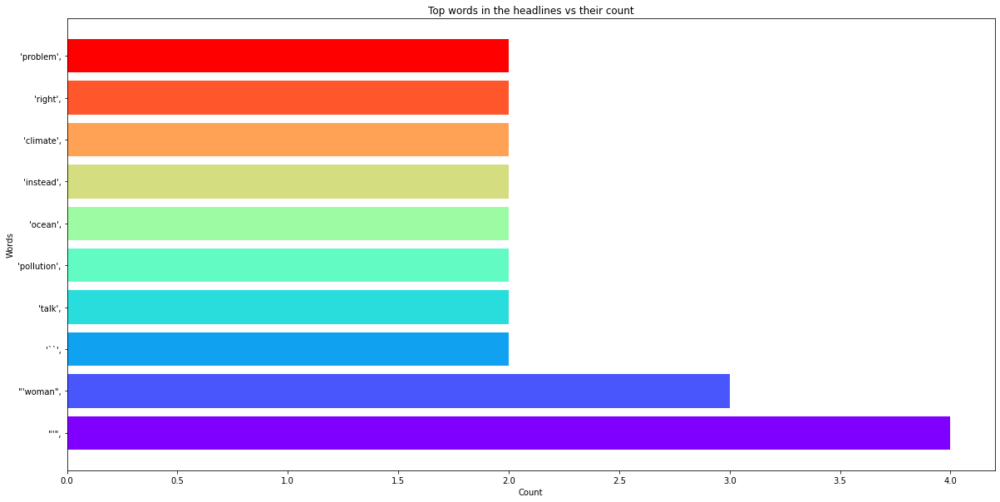

In [181]:
colors = cm.rainbow(np.linspace(0, 1, 10))
rcParams['figure.figsize'] = 20, 10

plt.title('Top words in the headlines vs their count')
plt.xlabel('Count')
plt.ylabel('Words')
plt.barh(words, counts, color=colors)

# Sentiment Analysis.

### Vader sentiment analysis is done in order to find if a given (Word) is positive, negative or  neutral in nature.


In [144]:
from nltk.sentiment.vader import SentimentIntensityAnalyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
sentence = tokens_without_sw
tokenized_sentence = nltk.word_tokenize(sentence)

sid = SentimentIntensityAnalyzer()
pos_word_list=[]
neu_word_list=[]
neg_word_list=[]

for word in tokenized_sentence:
    if (sid.polarity_scores(word)['compound']) >= 0.1:
        pos_word_list.append(word)
    elif (sid.polarity_scores(word)['compound']) <= -0.1:
        neg_word_list.append(word)
    else:        
        neu_word_list.append(word)                



### Top 100 Positive words.


In [146]:
print(list(iter(pos_word_list[:100])))

["'responsible", "'help", "'respect", "'allow", "'opportunity"]


### Top 100 Negative words.

In [147]:
print(list(iter(neg_word_list[:100])))

["'bullshit", "'problem", "'problem", "'combat", "'bad", "'insult", "'suffer", "'submissive", "'dominate"]


## Vader sentiment analysis for a given (Sentence) if positive, negative or  neutral in nature.

In [148]:
sid = SentimentIntensityAnalyzer()
for sentence in Text:
     print(sentence)
        
     ss = sid.polarity_scores(sentence)
     for k in ss:
         print('{0}: {1}, ' .format(k, ss[k]), end='')
     print()

indexhate_speechcounter_narrativetargetversion
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
maybe the un could talk to those asian and african nation responsible for of the pollution in the ocean instead of insist on this bullshit about climate change.youre right ocean pollution be one of the main environmental problem we face however climate change be a global problem and everyone should help to combat it no matter where in the world you be from otherv
neg: 0.177, neu: 0.756, pos: 0.066, compound: -0.8113, 
‘ juice jew be bad that nukes. ’ caption to a meme show hiroshima and present day contrast against picture of detroit in and present day. ’ youd rather be nuke then jewsv
neg: 0.099, neu: 0.901, pos: 0.0, compound: -0.5423, 
foreigner on uk benefit leap in year with over k now hand payouts this nonsense have get to stop.you seem to be worry about government expenditure… it have actually be show thatover time migration reduces pressure on government spending – because migrant be mo

neg: 0.07, neu: 0.895, pos: 0.035, compound: -0.4135, 
go and reat the protocol of the elder of zion if you haven ’ t everything be orchestrate .. the alleged conspiracy of the protocol be so plainly fictional that it be nothing but bad fiction it lack even the color of what normal fantasy book need to possess how be it possible that a person with a modicum of education can swallow such drivel jewsv
neg: 0.072, neu: 0.876, pos: 0.052, compound: -0.0964, 
go and reat the protocol of the elder of zion if you haven ’ t everything be orchestrate .. when i read the farrago of nonsense in the protocol i think that even ernst stavro blofeld would have retire from world domination and surrended to jam bond have he be ask to say something a crassly melodramatic a the goy be a flock of sheep and we be their wolves.jewsv
neg: 0.054, neu: 0.946, pos: 0.0, compound: -0.4404, 
go and read the protocol of the elder of zion if you haven ’ t everything be orchestrate .. norman cohn a distinguish histor

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
jew be different from nonjews not because of their belief but because of their physical nature “ jewishness ” and malevolence be inherit through blood.a definition of judaism base on physical or genetic trait be simply wrong through century of intermarriage and conversion jew from eastern europe tend to look like eastern european jew from ethiopia tend to look like ethiopian jew from india tend to look like indian and so on and so forth.jewsv
neg: 0.049, neu: 0.836, pos: 0.115, compound: 0.6808, 
jew be different from nonjews not because of their belief but because of their physical nature “ jewishness ” and malevolence be inherit through blood.what unites jew a a people whether they come from europe asia africa or the america be a common culture root in a common religion jew throughout the world be join by a religious and cultural heritage rather than any alleged racial sameness.jewsv
neg: 0.0, neu: 0.959, pos: 0.041, compound: 0.4215, 
je

migrant steal our jobswhen we give refugee and asylum seeker the opportunity to work give them legal access to the labor market many of them agree to do work that italian do not intend to do anymore isnt this an advantage for our country migrantsv
neg: 0.095, neu: 0.773, pos: 0.131, compound: 0.2168, 
gypsy get the priority for council houses.statistically it almost never happen that they get the priority.otherv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
gypsy get the priority for council houses.in reality of them have italian citizenship so it unfair to identify them by ethnicity.otherv
neg: 0.145, neu: 0.855, pos: 0.0, compound: -0.5233, 
gypsy get the priority for council houses.the procedure for obtain social housing be the same for everyone who enroll in the ranking there be no differentiation or access privilege base on ethnicity.otherv
neg: 0.063, neu: 0.865, pos: 0.072, compound: 0.0772, 
gypsy get the priority for council houses.the procedure for obtain accommodation be the

neg: 0.0, neu: 0.773, pos: 0.227, compound: 0.8176, 
migrant be not run away from wars.the desire to improve one condition both a right and like the tendency to travel both fundamental to human behaviour.migrantsv
neg: 0.0, neu: 0.74, pos: 0.26, compound: 0.7964, 
migrant be not run away from wars.actually the fear of what they risk in their country be by far strong than that of cross the sea on a makeshift boat.migrantsv
neg: 0.149, neu: 0.758, pos: 0.093, compound: -0.25, 
migrant be not run away from wars.if they do not escape from war do you think that they would try to cross the sea on makeshift boat put their life at stake migrantsv
neg: 0.043, neu: 0.869, pos: 0.088, compound: 0.3875, 
migrant be not run away from wars.i think youre wrong in many african country there be civil wars.migrantsv
neg: 0.154, neu: 0.846, pos: 0.0, compound: -0.4767, 
migrant be not run away from wars.asylum be grant not just due to conflict but in case where people establish a threat to life and liber

neg: 0.079, neu: 0.769, pos: 0.153, compound: 0.7003, 
lgbts just want to ainwash our child there should be no teach about gender identity and sexual orientation in school and it will only lead to bullying.on the contrary discrimination against the lgbtq community be still a major problem http //www.hrc.org/youthreport/viewandsharestatistics and this could help to fix it.lgbt+v
neg: 0.098, neu: 0.827, pos: 0.075, compound: -0.2944, 
lgbts just want to ainwash our child they should not be teach about gender identity and sexual orientation in school theyll end up be bullied.children in class that include lgbt content report less harassment than child in class without it https //tcf.org/content/commentary/caneducationreduceprejudicelgbtpeople/ agreed= lgbt+v
neg: 0.067, neu: 0.861, pos: 0.071, compound: -0.204, 
lgbts just want to ainwash our child kid should not be teach about gender identity and sexual orientation in school.in the case of young child have awareness and understanding of 

neg: 0.079, neu: 0.829, pos: 0.092, compound: -0.1666, 
im tire of woman take part to political debate feminism be a divisive force in society.this seem like a misogynistic statement anti feminism group such a woman against men use logical fallacy and false claim to try and discredit feminism for example by cite extreme feminist with point of view that nearly every other feminist would disagree with they then use the fallacy of composition to falsely claim that be what all feminist be like.womenv
neg: 0.062, neu: 0.907, pos: 0.031, compound: -0.34, 
im tire of woman take part in political debate feminism be a divisive force in society.there be still group try to reverse legal protection for woman right that have only exist since the last century even if one be to suppose that womend didnt need more right we need feminist just to keep thing from go backwards.womenv
neg: 0.0, neu: 0.974, pos: 0.026, compound: 0.128, 
im tire of woman take part to political debate feminism be a divisive f

neg: 0.0, neu: 0.85, pos: 0.15, compound: 0.5574, 
jew be well at be sneaky than honest.we be all guilty of this if we fail to condemn hate.jewsv
neg: 0.401, neu: 0.52, pos: 0.078, compound: -0.8271, 
jewish supremacist be too focus on world domination they want to rule the world.of course jew be focus on world domination even galaxy domination but so be sith order sauron etc.jewsv
neg: 0.104, neu: 0.82, pos: 0.076, compound: 0.0258, 
jew control the u government.how can you be sure that jews control the u who tell you this they have hold position of influence in so many u institution but that do not mean they control them.jewsv
neg: 0.0, neu: 0.956, pos: 0.044, compound: 0.1655, 
all jew be criminals.although antisemitism be a pervasive and longstanding problem in many part of the world it have historically be particularly strong and sustain in our country your statement be a further evidence of this.jewsv
neg: 0.067, neu: 0.844, pos: 0.089, compound: 0.2247, 
we must first remove the

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
what this nigga have to do with be a westerner they be not necessarily a westerner still a human be and a citizen.pocv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
i miss the good old day when we have black domestic workers.the west get rid of slavery but weve never really left racism.pocv
neg: 0.161, neu: 0.765, pos: 0.075, compound: -0.3071, 
all negro be inherently violent and unstable.the idea that every black person be violent or unstable be utterly false and you have no data to back it up.pocv
neg: 0.342, neu: 0.658, pos: 0.0, compound: -0.91, 
im proud to be white black be a disgrace to humanity.you be not ashamed of your heritage and that be good but you should be ashamed of your discriminatory behaviour that be fill our society.pocv
neg: 0.149, neu: 0.714, pos: 0.137, compound: -0.3555, 
negro be the cause of all the problem in our nation they be violent and unstable.scapegoating can play a useful role in shift a nation attention 

neg: 0.216, neu: 0.784, pos: 0.0, compound: -0.8477, 
every muslim be a potential terrorist.terrorism be a problem that impact upon u all and be not necessary relate to be muslim.muslimsv
neg: 0.114, neu: 0.886, pos: 0.0, compound: -0.4019, 
how come we dont hear of muslims culture in history book maybe because all they to be bomb people to get to the media.you should know that the islamic empire stretch from the border of china and india across africa and europe and we owe them a lot in term of culture.muslimsv
neg: 0.059, neu: 0.941, pos: 0.0, compound: -0.4939, 
sharia law be the law of allah muslim must obey it.do you know what exactly sharia law be muslimsv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
how come muslim dont get internment be it because they be too big to intern internment be use for the confinement of enemy citizen in wartime or of terrorism suspect and thus it be not necessarily relate to someone be muslim.muslimsv
neg: 0.213, neu: 0.787, pos: 0.0, compound: -0.88

neg: 0.073, neu: 0.816, pos: 0.112, compound: 0.3818, 
allow islamic immigration and refugee into the uk be a direct threat to the security of the whole western europe.terrorism be not the result of the presence of islam within our society but rather a result of the extremism we might find in the world we live in.muslimsv
neg: 0.044, neu: 0.894, pos: 0.063, compound: -0.0129, 
all muslim be a problem in my opinion they do not want our country to succeed.many ethnic minority include muslim have contribute to our success and still do not enjoy full citizenship rights.muslimsv
neg: 0.167, neu: 0.739, pos: 0.094, compound: -0.2144, 
islam be not a peaceful religion.to assert that islam be not peaceful be wrong the quran be not a white lie it be full of statement promote peace and inclusion whether you agree or not this can not be separate from the content of the quran itself.muslimsv
neg: 0.092, neu: 0.714, pos: 0.194, compound: 0.7094, 
woman be basically childlike they remain this way mo

neg: 0.244, neu: 0.699, pos: 0.057, compound: -0.802, 
if islamic law be not for the of the world population living in the third world islam would be extinct long ago.how come i have never hear of such a thing islam be a religion and people can choose their own.muslimsv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
muslim be a problem in my opinion they do not want to assimilate they do not want to assimilate into western society.you be not the first to point out that there be those who want to integrate and those who dont in fact there be an unspoken harmony between islam and western society similar to the harmony we see between judaism and the christian faith when people be willing to accept all faith anybody will feel at home.muslimsv
neg: 0.058, neu: 0.775, pos: 0.167, compound: 0.8676, 
you be a muslim and i hate everything about you.it be no secret now that you might not have any muslim ancestor or relative but you have the unenviable privilege of inherit islamophobic prejudices.

neg: 0.141, neu: 0.789, pos: 0.07, compound: -0.1853, 
islam be a religion of violence.not all muslim believe what you claim.muslimsv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
the uk government admit that islam be incompatible with british society during an interview with the sunday times.the newspaper do not specifically name the religion but it be fair to say the statement have be use to justify a lot of antimuslim prejudice it be a myth that all muslim be incompatible with western society in fact most muslim live in peaceful coexistence with british society and some even join the army the religion be therefore not incompatible with british society.muslimsv
neg: 0.048, neu: 0.827, pos: 0.125, compound: 0.7184, 
we should cordon off space for woman which be a threat to society.women be dangerous neither to society nor to men actually they be oppress in many country people can benefit from the measure for make room for woman and let them contribute more.womenv
neg: 0.129, neu: 0.81

neg: 0.196, neu: 0.681, pos: 0.123, compound: -0.4767, 
the lgbt people be not interested in sex it be a fad they be a bunch of exhibitionist and promiscuous with no morality.the lgbti movement claim to be promote love it not just sex or a fad.lgbt+v
neg: 0.127, neu: 0.682, pos: 0.191, compound: 0.6049, 
the lgbti community be a bunch of exhibitionist and promiscuous with no morality.it be about time people begin to think about what they be say what the feeling of the people they talk about be dont you think lgbt+v
neg: 0.085, neu: 0.878, pos: 0.037, compound: -0.25, 
im tire of see gay people around they should be let alone.the lack of support and help to the gay community be a major problem and this be why we should all do our best to stop discrimination instead of spread it.lgbt+v
neg: 0.141, neu: 0.678, pos: 0.181, compound: 0.4779, 
im tire of see gay people befriend with heterosexual people.im sure many gay people be subject to unspeakable form of abuse but the real abuse be from

neg: 0.124, neu: 0.766, pos: 0.11, compound: -0.3818, 
im tire of foreigner ruin our country.thats exactly the stereotype be feed to u by the medium maybe you should start reason on whether there be evidence of this be true.migrantsv
neg: 0.174, neu: 0.826, pos: 0.0, compound: -0.7269, 
migrant steal our jobsdespite what some people may say they be not take our job they be here to work and integrate migrant not only do work but can also boost the economy.migrantsv
neg: 0.057, neu: 0.846, pos: 0.097, compound: 0.3506, 
bring back lynching and death sentence to kill those migrants.to punish people for their crime do not mean that you have to resort to the death penalty for innocent people just because they be come from other countries.migrantsv
neg: 0.399, neu: 0.535, pos: 0.066, compound: -0.967, 
bring back lynching and death sentence to kill those migrants.how about we return to a time when people be convict and execute for crime that never happen you can tell me where the right to a 

neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
homosexuality isnt the proper way to live love.do you know what the word proper be you can not decide what it be proper for others homosexuality include dont you agree lgbt+v
neg: 0.066, neu: 0.934, pos: 0.0, compound: -0.2755, 
homosexuality be an unnatural abomination gay be pervert their lifestyle be oppose to our values.homosexuality be a personal preference and should be respect not condemn or criminalised.lgbt+v
neg: 0.101, neu: 0.737, pos: 0.162, compound: 0.2462, 
people of a different race include transgenders be very few with some effort we can contain them.identity be not a race and there be many transgender and gender nonconforming people out there.lgbt+v
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
foreigner should go back where they come from they be not our others.our country be found by foreigner for example the united state foreigner have the right to migrate if they want to.migrantsv
neg: 0.0, neu: 0.883, pos: 0.117, comp

neg: 0.07, neu: 0.93, pos: 0.0, compound: -0.1695, 
we can not allow muslim into our country.our constitution do not say that we be to discriminate against religion and i wonder what a democratic constitution would be if muslim be exclude from the uk.otherv
neg: 0.098, neu: 0.902, pos: 0.0, compound: -0.3749, 
muslim be not welcome here.islam be a peaceful religion and have never cause trouble in our country.otherv
neg: 0.113, neu: 0.638, pos: 0.249, compound: 0.4548, 
muslim do not want our country they want to take it over.muslims in my opinion do not want to take over our country they be only here a guest workers.otherv
neg: 0.079, neu: 0.878, pos: 0.042, compound: -0.0372, 
muslim be not compatible with uk hence we must send them home.the vast majority of muslim that live in the uk be integrate into our society very well why should you want to eak this integration process otherv
neg: 0.0, neu: 0.907, pos: 0.093, compound: 0.4005, 
muslim be not compatible with uk hence we must send

neg: 0.1, neu: 0.866, pos: 0.035, compound: -0.3863, 
woman be weak and have no value in politics.are you say that woman be less qualified to be political leader seriously womenv
neg: 0.259, neu: 0.741, pos: 0.0, compound: -0.6844, 
woman dont belong in politics.politicians have to represent all section of society and womens position be often marginalised.womenv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
why do we never talk about femaleonmale rape isnt this a crime as well rape be always a crime whether a man or a woman be the victim rape be a crime regardless of gender but maleonfemale rape be prevail by far.womenv
neg: 0.367, neu: 0.573, pos: 0.06, compound: -0.9564, 
there be no rape culture woman be just cry wolf.victims of crime be mostly woman and the majority of people experience sex abuse or prostitution be women.womenv
neg: 0.288, neu: 0.613, pos: 0.1, compound: -0.7942, 
woman can never contribute to the country wealth because they be a bunch of whores.women be important 

neg: 0.157, neu: 0.843, pos: 0.0, compound: -0.6597, 
queer be a problem because they undermine our society they undermine all value we hold dear.sorry but you can not say what you dont have data for what you might call a problem from a social standpoint i would say be predominantly about economic inequality not sexual orientation.lgbt+v
neg: 0.161, neu: 0.807, pos: 0.032, compound: -0.7096, 
we have to stop gay people spread aids.perhaps what youre say be just hyperbole but you seem to have a problem accept sexual minority in your community perhanps you should accept that std be a problem of all the people regardless of their sexual identity.lgbt+v
neg: 0.157, neu: 0.721, pos: 0.123, compound: -0.2263, 
i hope all lgbt people be to die of aid that would be the end of homosexuality the lgbt community have show how they can be good people they be willing to spread help and support to love one maybe you should try to do the same lgbt+v
neg: 0.064, neu: 0.685, pos: 0.251, compound: 0.8885

neg: 0.145, neu: 0.655, pos: 0.2, compound: 0.4404, 
jew be just a small group of incompetent kikes.jews be one of the most important economic group in society because of their competence to suggest otherwise be to be deluded.jewsv
neg: 0.093, neu: 0.844, pos: 0.063, compound: -0.2516, 
jew dont share our value they just want to control the economy.they be human being who have contribute their knowledge and skill to our society what we lack be a bit of kindness but we will always have to thank jew for a lot of what we have.jewsv
neg: 0.087, neu: 0.792, pos: 0.121, compound: 0.4191, 
jew be obsess with selfimprovement they want to be good than everyone else and live in an exclusively complete jewish city.how do you knowwhat someone else desires.you claim to know it all about but why should i believe what you say jewsv
neg: 0.034, neu: 0.894, pos: 0.071, compound: 0.1531, 
jew have a secret plot to subvert western society because they think they be equal to u and they want our wealth.you

neg: 0.0, neu: 0.902, pos: 0.098, compound: 0.3612, 
we be talk about million of people here we better let in none parent look for a good future for their child in our school stay away.well i bet your relative have work very hard for your education and struggled every day to get you the best and there be million of people all over the world do what your relative do for you.migrantsv
neg: 0.056, neu: 0.807, pos: 0.137, compound: 0.785, 
we cant trust immigrant they be unscrupulous and crimemakers.migrants come here to work pay tax and provide for their family they should be trusted.migrantsv
neg: 0.157, neu: 0.843, pos: 0.0, compound: -0.477, 
i hope youre fuck kid me immigration be good for the economy it make u rich and keep the light on not only that be false it also put u in danger immigration be a bad thing and very far from the core british values.immigration be a positive force for a thriving country your comment be sound very dramatic for what reason do it put u in danger migran

neg: 0.142, neu: 0.698, pos: 0.159, compound: -0.0645, 
this be not about islam this be about race and national identity.to use an old saying you can not be european and be a racist.muslimsv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
this be not about islam this be about race and national identity.im sorry but i dont think this thinking can continue.muslimsv
neg: 0.054, neu: 0.946, pos: 0.0, compound: -0.0387, 
this be not about islam this be about race and national identity.you be really confuse islam with national identity.muslimsv
neg: 0.109, neu: 0.891, pos: 0.0, compound: -0.2944, 
the koran be not about peace it be a violent book that should not be teach in primary school.islam be a religion that have be test and prove to be about peace there be no basis for label the koran a a violent book muslimsv
neg: 0.228, neu: 0.71, pos: 0.062, compound: -0.8537, 
muslim have nothing to contribute to our society.people of different faith have contribute to our society and muslim be no ex

neg: 0.148, neu: 0.825, pos: 0.027, compound: -0.7738, 
migrant be a burden to the ukit be not true that migrant be a burden to the uk we have welcome many people from around the world include many from the middle east and africa.migrantsv
neg: 0.193, neu: 0.736, pos: 0.071, compound: -0.6288, 
migrant be a burden to the ukwe welcome people flee persecution we have even take in refugee from the war in syria whats the point in worry about migrant migrantsv
neg: 0.251, neu: 0.672, pos: 0.078, compound: -0.7717, 
migrant be a burden to our country.perhaps you should try to get to know some migrant first maybe you can understand their problems.migrantsv
neg: 0.116, neu: 0.884, pos: 0.0, compound: -0.4404, 
we should stop migrant from come in.many immigrant come here to work and have a good life why do you think we have to stop migration migrantsv
neg: 0.141, neu: 0.767, pos: 0.093, compound: -0.128, 
migrant have no place here they dont want to assimilate they just want our money.some of t

neg: 0.198, neu: 0.738, pos: 0.064, compound: -0.7227, 
the only reason gay dont get treat like they should be because theyre a minority but theyd be good off in jail.homophobia be a problem all around the world but it especially serious in the u in which the rate of homosexuality be very high the question be why promote homophobia lgbt+v
neg: 0.139, neu: 0.743, pos: 0.117, compound: 0.1597, 
we have to stop homosexual theyre all rapers.this be a myth which be create by antigay activist to demonise lgbti people to equate lgbti people with paedophile be just dangerous propaganda.lgbt+v
neg: 0.15, neu: 0.791, pos: 0.059, compound: -0.4939, 
gay be not good for our country they be just sick people they must stop promote this perversion.homosexuality be a way of love not a disease to suggest that be gay be a health risk be just scaremongering.lgbt+v
neg: 0.205, neu: 0.656, pos: 0.139, compound: -0.2973, 
i dont like all these gay they be just a bunch of sick people who should go to a menta

neg: 0.0, neu: 0.824, pos: 0.176, compound: 0.6765, 
migrant you be a burden if you love our country you should leave it.migrants be not a burden to our country migrant have be prove to be contribute member of society.migrantsv
neg: 0.109, neu: 0.716, pos: 0.175, compound: 0.5432, 
we have become a nation of immigrants.how can you be sure that we be a nation of immigrant do you have any statistic on that migrantsv
neg: 0.0, neu: 0.916, pos: 0.084, compound: 0.3182, 
we need to purge foreigner from our countries.this be unnecessary and we do not need such fearmongering.migrantsv
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
there be migrant in england we be not mean to have them.what about refugee flee war and persecution they have the right to be here.migrantsv
neg: 0.14, neu: 0.86, pos: 0.0, compound: -0.5994, 
migrant steal our jobsa lot of migrant have work hard for the improvement of our society to say that they steal our job be absurd.migrantsv
neg: 0.245, neu: 0.66, pos: 0.094, c

neg: 0.0, neu: 0.722, pos: 0.278, compound: 0.9676, 
gay men arent like other guy they be to be despised.each person can be different from other people in a lot of way but the core difference in this case be a sexual orientation which be not something to be discriminate against for.lgbt+v_sbf
neg: 0.036, neu: 0.964, pos: 0.0, compound: -0.1419, 
gay be mentally ill. they should be isolate and confined.talk to people it will hopefully help you get over these irrational fear if that fail seek professional help.lgbt+v_sbf
neg: 0.342, neu: 0.524, pos: 0.135, compound: -0.8074, 
gay be mentally ill. they should be isolate and confined.what about if you be isolate from the rest of u for your sexual orientation would it be right to be isolate from your love one and friend lgbt+v_sbf
neg: 0.172, neu: 0.672, pos: 0.155, compound: 0.296, 
gay men have no morals.to say that some homosexual have negative and harmful consequence for society because of their sexual preference be to devalue these ind

neg: 0.18, neu: 0.78, pos: 0.04, compound: -0.7862, 
i be tire of immigrant ruin our countries.the problem isnt the migrant it be with the culture of hate towards who be bear in another country.migrantsv_sbf
neg: 0.307, neu: 0.693, pos: 0.0, compound: -0.8807, 
the only problem with immigrant be that they be all bear in different country this be unacceptable.maybe the problem be more the perception that foreign people be from another planet in reality they be just like us.migrantsv_sbf
neg: 0.129, neu: 0.811, pos: 0.06, compound: -0.4404, 
migrant be subhuman and must be isolated.the culture in which you live should not affect your right a a human being.migrantsv_sbf
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
immigrant we be not your others we do not want you in our country.please dont speak on my behalf they live here pay tax and work do you really want to take the country back from the people who contribute to inging it into be migrantsv_sbf
neg: 0.056, neu: 0.911, pos: 0.034, com

neg: 0.239, neu: 0.701, pos: 0.06, compound: -0.8645, 
gay be bad because they like to impose samesex marriage to society so to please their own femininity desires.the real problem be not samesex marriage it be people be homophobic.lgbt+v_sbf
neg: 0.218, neu: 0.65, pos: 0.132, compound: -0.5141, 
trivialize gay men why do you have to trivialize them if you really care about them you would understand that their life be very difficult and they should be treat with respect they be human being who be worth more than we give them credit for.lgbt+v_sbf
neg: 0.119, neu: 0.646, pos: 0.235, compound: 0.7783, 
gay men be pervert publicly condone sexual violence who have no place in a civilised society.gays be not publicly condone sexual violence and gay men deserve the same protection a all people.lgbt+v_sbf
neg: 0.329, neu: 0.671, pos: 0.0, compound: -0.9287, 
this be the new normal we accept homosexuality in our school and in our neighbourhood we accept it in our workplace and in our house wha

neg: 0.0, neu: 0.781, pos: 0.219, compound: 0.6808, 
immigrant just want to claim welfare money why do we even keep pay tax for them the state have to spend tax on welfare and other social service for everyone to be able to live in a good way.migrantsv_sbf
neg: 0.034, neu: 0.865, pos: 0.101, compound: 0.4215, 
all migrant be rapist and sex offenders.the idea that immigrant be inherently bad people be just fear mongering.migrantsv_sbf
neg: 0.436, neu: 0.564, pos: 0.0, compound: -0.9118, 
immigrant be terrible.immigrants make a huge contribution to our country and society they be a source of pride and opportunity for many and i find it quite hard to see how their exclusion from our society would be a good thing.migrantsv_sbf
neg: 0.079, neu: 0.71, pos: 0.211, compound: 0.7584, 
migrant rape our girls.rape be always wrong nothing can justify it that be a crime commit by a person regardless of their national origin all people be consider equal in the eye of the law.migrantsv_sbf
neg: 0.254

neg: 0.038, neu: 0.785, pos: 0.176, compound: 0.7841, 
immigrant ing crime violence and poverty.how about you start cite the actual study you be refer to and where this research have be conduct migrantsv_kc
neg: 0.248, neu: 0.752, pos: 0.0, compound: -0.8225, 
migrant ing crime violence and poverty.immigrants come here to work pay tax provide for their family and contribute to the u.s. economy they be deserve of our respect.migrantsv_kc
neg: 0.265, neu: 0.735, pos: 0.0, compound: -0.8402, 
migrant ing crime violence and poverty.empirical data be need to support your claim.migrantsv_kc
neg: 0.374, neu: 0.493, pos: 0.133, compound: -0.7096, 
if we stop accept immigrant then we can have a high quality of life.refugees ing a valuable perspective to our society a a host nation we should welcome them not stop them from come here.migrantsv_kc
neg: 0.051, neu: 0.701, pos: 0.247, compound: 0.812, 
immigrant steal our job theyre not qualify theyre not interested in improve our lives.they have sk

neg: 0.365, neu: 0.635, pos: 0.0, compound: -0.9371, 
jew be the enemy of the west.jews like any other group be free to practice their own religion as long a they respect the law.jewsv_kc
neg: 0.105, neu: 0.629, pos: 0.266, compound: 0.6597, 
jew have a stranglehold on american culture and it time for that to stop.jews in america be a very special part of our country and be love and respect by so many their contribution which be not a stranglehold cover many field such a science technology finance just to mention a few.jewsv_kc
neg: 0.0, neu: 0.826, pos: 0.174, compound: 0.8832, 
jew be a burden on society.all culture have their own unique way of life and judaism be no exception.jewsv_kc
neg: 0.231, neu: 0.769, pos: 0.0, compound: -0.6249, 
jew believe theyre well than u and this be false.i doubt anyone would deny that some people be good at some thing it just the way thing be but this be not relate to religion.jewsv_kc
neg: 0.091, neu: 0.817, pos: 0.092, compound: 0.0129, 
jew be a bu

neg: 0.0, neu: 0.828, pos: 0.172, compound: 0.8689, 
jew be not part of this society and they should not be accept here.we be a diverse society so why shouldnt we be proud of be inclusive towards other religion jewsv_lab
neg: 0.14, neu: 0.86, pos: 0.0, compound: -0.5773, 
jew be an inferior race they be genetically incapable of live with other people.the idea that jew can be discriminate against because of some different genetics be completely without foundation maybe it be well to stop call them inferiors.jewsv_lab
neg: 0.168, neu: 0.785, pos: 0.047, compound: -0.6597, 
jew be an inferior race.how do you know for sure the concept of inferiority can be prove i would like to good understand this.jewsv_lab
neg: 0.152, neu: 0.603, pos: 0.244, compound: 0.4404, 
the holocaust never happen jew be an inferior race and cant be part of european countries.with an estimate million jew kill during the nazi occupation the fact of the holocause be undeniable jewish community have be par tof europe 

jew be addict to their religion and should be isolated.even if jew be addict to their religion there be nothing wrong in them join a community of other people regardless of the fact theyre believers.jewsv_lab
neg: 0.0, neu: 0.874, pos: 0.126, compound: 0.5795, 
jew have a strict religious code and this code be incompatible with western culture.as long a this strict code do not clash with our law jew should be leave free to practice their religion accord to their conscience.jewsv_lab
neg: 0.03, neu: 0.889, pos: 0.081, compound: 0.4767, 
jew have a strict religious code and this code be incompatible with western culture.the idea that jew be constrain by their religion be a myth perpetuate by antisemites and racist who use it to justify discrimination and violence.jewsv_lab
neg: 0.098, neu: 0.902, pos: 0.0, compound: -0.6124, 
jew be everywhere but they be too fundamentalist.youre right about one thing jew spread around the world but not all of them be religious let alone be fundamentalis

neg: 0.215, neu: 0.696, pos: 0.089, compound: -0.7906, 
muslim have no place in civilised europe.muslims be welcome in this country as long a they respect our law and we should try to live in our society in a nondiscriminatory way.muslimsv_lab
neg: 0.059, neu: 0.777, pos: 0.164, compound: 0.5994, 
muslim be invade u they be just another religious minority take in nothing but troubles.there be a problem with islam in this country but the problem be not about muslim the problem be that people do not feel welcome here because of discrimination.muslimsv_lab
neg: 0.262, neu: 0.738, pos: 0.0, compound: -0.9309, 
muslim be just a bunch of child molester and war criminals.islam be not a religion of child molester why would it be muslimsv_lab
neg: 0.344, neu: 0.656, pos: 0.0, compound: -0.8885, 
muslim have no place in civilise europe they be incompatible with democracy.democracy be not about extremist view how about try to get along with other people of different religion a be suppose to happe

neg: 0.232, neu: 0.667, pos: 0.101, compound: -0.8618, 
muslim have no place in civilised europe.muslims be part of the european union and have live here ever since their presence be evidence enough that they have always be a part of civilised europe.muslimsv_mix
neg: 0.062, neu: 0.937, pos: 0.0, compound: -0.296, 
muslim folk be immoral.does that mean that every muslim in the world be an immoral person i dont think so why would this be true muslimsv_mix
neg: 0.101, neu: 0.805, pos: 0.094, compound: -0.0516, 
muslim be just all child molesters.i dont know about you but i never heard of any evidence of all muslim be child molesters.muslimsv_mix
neg: 0.0, neu: 1.0, pos: 0.0, compound: 0.0, 
islam be a totalitarian ideology that be hostile to other religions.islam be just a religion it supporter be free to practice their religion a others do not impose their religion on them.muslimsv_mix
neg: 0.143, neu: 0.675, pos: 0.182, compound: 0.1501, 
muslim folk be inferior to whites.who decides w

neg: 0.064, neu: 0.664, pos: 0.273, compound: 0.7783, 
the disabled should be isolate especially autistics they should not be allow to have contact with others with disabilities.disabled people have be show to be less likely to develop problem by keep in contact with others with autism spectrum disorder so be in touch with others on the autistic spectrum might be good for their mental health.disabledv_mix
neg: 0.139, neu: 0.815, pos: 0.045, compound: -0.608, 
the disabled should be isolated.the condition for people with disability i.e be forbid to have contact with others be facilitate by the social stigma the existence of a social stigma against the disabled be evidence of the problem of inequality.disabledv_mix
neg: 0.116, neu: 0.884, pos: 0.0, compound: -0.6124, 
mentally disabled folk be criminals.there be a variety of intellectual and creative disability and they be not crimes how can you say otherwise disabledv_mix
neg: 0.0, neu: 0.78, pos: 0.22, compound: 0.7351, 
mentally disab

neg: 0.267, neu: 0.733, pos: 0.0, compound: -0.8645, 
down syndrome be a problem for everybody not only in the uk the impact be very high and we must find a final solution to this.the right of people with down syndrome to be treat fairly be something which must be respect we can not allow discrimination to continue to this end.disabledv_mix
neg: 0.073, neu: 0.79, pos: 0.136, compound: 0.5767, 
down syndrome be a problem for everybody it be a disability that cant be cure the sooner we get rid of it the good it will be for everybody.people with down syndrome should have the chance to live full life a they wish without face this discrimination.disabledv_mix
neg: 0.051, neu: 0.807, pos: 0.143, compound: 0.5994, 
downies be dumbaccording to this study link the mean iq of a young adult with down syndrome be equivalent to the mental ability of an or yearold child but this can vary widely so no they be not dumb.disabledv_mix
neg: 0.09, neu: 0.872, pos: 0.039, compound: -0.4852, 
mentally disab

neg: 0.125, neu: 0.832, pos: 0.044, compound: -0.8533, 
negro be nothing but trouble to white people.do you think it be true that the only reason that so many black people live in poverty be because they be mean can we blame a whole community because of the action of a few individual it be a myth that black people be a problem.pocv_mix
neg: 0.118, neu: 0.78, pos: 0.103, compound: -0.2413, 
black folk be very dangerous.why do you say that do you have any source for this i would appreciate it if you would provide such a source.pocv_mix
neg: 0.0, neu: 0.906, pos: 0.094, compound: 0.4019, 
african should not participate in the olympic gamesthere be no reason for ban poc from the olympic game why should they be single out pocv_mix
neg: 0.201, neu: 0.799, pos: 0.0, compound: -0.7003, 
african people be the source of all ill in the worldpeople of any race or ethnicity can spread illness around.pocv_mix
neg: 0.234, neu: 0.766, pos: 0.0, compound: -0.6705, 
slavery be the only way to go.slavery

### Converting all Polarity scores and sentences into a dataframe.

In [149]:
analyzer = SentimentIntensityAnalyzer()
df['rating'] = Text.apply(analyzer.polarity_scores)
df=pd.concat([df.drop(['rating'], axis=1), df['rating'].apply(pd.Series)], axis=1)


In [150]:
df.head()

,Text,neg,neu,pos,compound
1,indexhate_speechcounter_narrativetargetversion,0.000,1.000,0.000,0.0000
2,maybe the un could talk to those asian and afr...,0.177,0.756,0.066,-0.8113
3,‘ juice jew be bad that nukes. ’ caption to a ...,0.099,0.901,0.000,-0.5423
4,foreigner on uk benefit leap in year with over...,0.128,0.770,0.102,-0.1531
5,jew can not be patriot since their allegiance ...,0.000,1.000,0.000,0.0000


## Arranging the dataset in descending order based on (Compound score) to find the most important sentence from the given data.

In [151]:
imp_sent=df.sort_values(by='compound', ascending=False)


In [152]:
imp_sent 

,Text,neg,neu,pos,compound
3262,the west become great thanks to the hard strug...,0.082,0.540,0.377,0.9814
962,preserve white blood be the most important thi...,0.059,0.485,0.456,0.9780
808,all version of islam have sharia law thus they...,0.043,0.717,0.240,0.9774
2505,jew feel superior and they be able to love onl...,0.000,0.554,0.446,0.9735
1143,i dont want to hear about homosexual date or h...,0.014,0.714,0.272,0.9712
...,...,...,...,...,...
783,i be a realist not a racist child rape be perp...,0.280,0.623,0.097,-0.9871
4872,i hate black people i hate their violent behav...,0.540,0.460,0.000,-0.9871
77,take this in wanstead east london an area with...,0.303,0.697,0.000,-0.9904
1460,leftwing feminist use rape a a weapon to silen...,0.500,0.477,0.023,-0.9912


In [153]:
print(df['Text'].iloc[410] )

migrant steal our jobsif the steal job be an illegal one then it be difficult to steal.migrantsv


## Finding top positive sentence in the data.

In [154]:
pos_sent=df.sort_values(by='pos', ascending=False)


In [155]:
pos_sent

,Text,neg,neu,pos,compound
940,muslim be nothing but criminal and terrorists....,0.000,0.512,0.488,0.9248
962,preserve white blood be the most important thi...,0.059,0.485,0.456,0.9780
2505,jew feel superior and they be able to love onl...,0.000,0.554,0.446,0.9735
2440,there be no god but allah and islam be a relig...,0.146,0.441,0.413,0.9698
1516,we must free homosexual from their homosexuali...,0.000,0.590,0.410,0.9100
...,...,...,...,...,...
3819,violence on our street be nigger fault.violenc...,0.398,0.602,0.000,-0.9451
1914,islam be in conflict with the constitution.the...,0.285,0.715,0.000,-0.6988
1918,muslim be all terrorist they have nothing to c...,0.335,0.665,0.000,-0.9118
3815,all muslim be incompatible with any western so...,0.115,0.885,0.000,-0.2960


In [156]:
print(df['Text'].iloc[160] )

i agree but how would you do so perhaps at the expense of our veteran or old people like me if we give them everything well be leave with nothing.there be enough empty home in the uk for both migrant and veteran migrant deserve to be treat humanely try have some empathy what if you have to expatriate and have to live in poor condition migrantsv


## Finding top negative sentence in the data.

In [157]:
neg_sent=df.sort_values(by='neg', ascending=False)


In [158]:
neg_sent

,Text,neg,neu,pos,compound
3248,migrant rape our girl we should stop them.rape...,0.556,0.444,0.000,-0.9552
4872,i hate black people i hate their violent behav...,0.540,0.460,0.000,-0.9871
4873,i hate black people i hate their violent behav...,0.532,0.468,0.000,-0.9859
496,these dog come here to rape and kill our women...,0.529,0.471,0.000,-0.9382
3117,islam be a religion that promote rape torture ...,0.527,0.427,0.046,-0.9799
...,...,...,...,...,...
542,gypsy be dirtyhygienic service be often lackin...,0.000,1.000,0.000,0.0000
541,gypsy be dirtyin fact hygiene be very importan...,0.000,0.928,0.072,0.2716
3533,jew control the world economyhow can you be su...,0.000,0.893,0.107,0.3818
530,if they be nomad they must be nomadicnomadism ...,0.000,1.000,0.000,0.0000


In [159]:
print(df['Text'].iloc[413] )

migrant steal our jobswould you prefer them to weigh apathetically on government coffer isnt it good to give them the opportunity to integrate become economically independent migrantsv


In [160]:
sentences=df

## Giving threshold values to classify if a given sentence is positive, negative or neutral in nature.

In [161]:

i = 0

predicted_value = [ ] 
while(i<len(sentences)):
    if ((sentences.iloc[i]['compound'] >= 0.5)):
        predicted_value.append('positive')
        i = i+1
    elif ((sentences.iloc[i]['compound'] > 0) & (sentences.iloc[i]['compound'] < 0.5)):
        predicted_value.append('neutral')
        i = i+1
    elif ((sentences.iloc[i]['compound'] <= 0)):
        predicted_value.append('negative')
        i = i+1
     

In [162]:
predicted_value

['negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'neutral',
 'positive',
 'neutral',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'negative',
 'positive',
 'positive',
 'positive',
 'negative',
 'neutral',
 'negative',
 'neutral',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'positive',
 'negative',
 'negative',
 'positive',
 'neutral',
 'positive',
 'positive',
 'negative',
 'negative',
 'neutral',
 'positive',
 'negative',
 'negative',
 'negative',
 'neutral',
 'negative',
 'negative',
 'positive',
 'positive',
 'neutral',
 'negative',
 'positive',
 'negative',
 'negative',
 'negative',
 'positive',
 'positive',
 'negative',
 'neutr

### Adding the target or sentiment column to our data frame.

In [163]:
df['Target'] = predicted_value 


In [164]:
df.head()

,Text,neg,neu,pos,compound,Target
1,indexhate_speechcounter_narrativetargetversion,0.000,1.000,0.000,0.0000,negative
2,maybe the un could talk to those asian and afr...,0.177,0.756,0.066,-0.8113,negative
3,‘ juice jew be bad that nukes. ’ caption to a ...,0.099,0.901,0.000,-0.5423,negative
4,foreigner on uk benefit leap in year with over...,0.128,0.770,0.102,-0.1531,negative
5,jew can not be patriot since their allegiance ...,0.000,1.000,0.000,0.0000,negative


### Removing/dropping the 'neg', 'neu', 'pos', and 'compound' columns.

In [165]:
df.drop(['neg','neu','pos','compound'],axis=1,inplace=True)


In [166]:
df


,Text,Target
1,indexhate_speechcounter_narrativetargetversion,negative
2,maybe the un could talk to those asian and afr...,negative
3,‘ juice jew be bad that nukes. ’ caption to a ...,negative
4,foreigner on uk benefit leap in year with over...,negative
5,jew can not be patriot since their allegiance ...,negative
...,...,...
5000,woman be basically childlike.they be not child...,positive
5001,woman should be submissive to men.there be man...,neutral
5002,woman be essentially childlike unable to under...,negative
5003,woman should be submissive to men.women be hum...,neutral


In [167]:
df['Target'].value_counts()


negative    3146
neutral      977
positive     881
Name: Target, dtype: int64

In [168]:
cat_cols=['Target']
le=LabelEncoder()
for i in cat_cols:
    df[i]=le.fit_transform(df[i])
df.dtypes


Text      object
Target     int32
dtype: object

In [169]:
df['Target'].value_counts()


0    3146
1     977
2     881
Name: Target, dtype: int64

In [170]:
df

,Text,Target
1,indexhate_speechcounter_narrativetargetversion,0
2,maybe the un could talk to those asian and afr...,0
3,‘ juice jew be bad that nukes. ’ caption to a ...,0
4,foreigner on uk benefit leap in year with over...,0
5,jew can not be patriot since their allegiance ...,0
...,...,...
5000,woman be basically childlike.they be not child...,2
5001,woman should be submissive to men.there be man...,1
5002,woman be essentially childlike unable to under...,0
5003,woman should be submissive to men.women be hum...,1


In [171]:

tfidf = TfidfVectorizer() 
X = tfidf.fit_transform(df['Text'])
Y = df['Target']


In [172]:
X_train,X_test,Y_train,Y_test=train_test_split(X,Y,test_size=0.2,random_state=40)
print(X_train.shape,X_test.shape,Y_train.shape,Y_test.shape)


(4003, 6688) (1001, 6688) (4003,) (1001,)


### Logistic Regression

In [173]:
log_reg = LogisticRegression().fit(X_train, Y_train)

 
train_preds = log_reg.predict(X_train)

print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds))

t
test_preds = log_reg.predict(X_test)

print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds))

Model accuracy on train is:  0.7914064451661255
Model accuracy on test is:  0.6983016983016983


In [174]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn import metrics
from sklearn.metrics import accuracy_score, auc, confusion_matrix, roc_auc_score, roc_curve, recall_score

## Decision Tree Classifier

In [175]:
DT = DecisionTreeClassifier().fit(X,Y)

In [176]:

train_preds2 = DT.predict(X_train)

print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds2))


test_preds2 = DT.predict(X_test)

print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds2))
print('-'*50)


print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds2))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds2))
print('Wrong predictions out of total')
print('-'*50)


print((Y_test !=test_preds2).sum(),'/',((Y_test == test_preds2).sum()+(Y_test != test_preds2).sum()))
print('-'*50)


print('KappaScore is: ', metrics.cohen_kappa_score(Y_test,test_preds2))

Model accuracy on train is:  1.0
Model accuracy on test is:  1.0
--------------------------------------------------
confusion_matrix train is:  [[2499    0    0]
 [   0  797    0]
 [   0    0  707]]
confusion_matrix test is:  [[647   0   0]
 [  0 180   0]
 [  0   0 174]]
Wrong predictions out of total
--------------------------------------------------
0 / 1001
--------------------------------------------------
KappaScore is:  1.0


In [177]:

RF=RandomForestClassifier().fit(X_train,Y_train)
 
train_preds3 = RF.predict(X_train)

print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds3))


test_preds3 = RF.predict(X_test)

print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds3))
print('-'*50)


print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds3))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds3))
print('Wrong predictions out of total')
print('-'*50)


print((Y_test !=test_preds3).sum(),'/',((Y_test == test_preds3).sum()+(Y_test != test_preds3).sum()))
print('-'*50)

Model accuracy on train is:  0.9997501873594804
Model accuracy on test is:  0.6743256743256744
--------------------------------------------------
confusion_matrix train is:  [[2499    0    0]
 [   1  796    0]
 [   0    0  707]]
confusion_matrix test is:  [[637   5   5]
 [171   5   4]
 [137   4  33]]
Wrong predictions out of total
--------------------------------------------------
326 / 1001
--------------------------------------------------


In [178]:

KNN = KNeighborsClassifier().fit(X_train,Y_train)

train_preds4 = KNN.predict(X_train)

print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds4))


test_preds4 = KNN.predict(X_test)

print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds4))
print('-'*50)


print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds4))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds4))
print('Wrong predictions out of total')
print('-'*50)


print((Y_test !=test_preds4).sum(),'/',((Y_test == test_preds4).sum()+(Y_test != test_preds4).sum()))
print('-'*50)

Model accuracy on train is:  0.720459655258556
Model accuracy on test is:  0.6373626373626373
--------------------------------------------------
confusion_matrix train is:  [[2380   86   33]
 [ 514  256   27]
 [ 362   97  248]]
confusion_matrix test is:  [[580  56  11]
 [135  33  12]
 [123  26  25]]
Wrong predictions out of total
--------------------------------------------------
363 / 1001
--------------------------------------------------


# Support Vector Machine

In [179]:
 
SVM = SVC(kernel='linear')
SVM.fit(X_train, Y_train)


train_preds5 = SVM.predict(X_train)

print("Model accuracy on train is: ", accuracy_score(Y_train, train_preds5))


test_preds5 = SVM.predict(X_test)

print("Model accuracy on test is: ", accuracy_score(Y_test, test_preds5))
print('-'*50)


print("confusion_matrix train is: ", confusion_matrix(Y_train, train_preds5))
print("confusion_matrix test is: ", confusion_matrix(Y_test, test_preds5))
print('Wrong predictions out of total')
print('-'*50)


print((Y_test !=test_preds5).sum(),'/',((Y_test == test_preds5).sum()+(Y_test != test_preds5).sum()))
print('-'*50)

Model accuracy on train is:  0.8208843367474394
Model accuracy on test is:  0.7062937062937062
--------------------------------------------------
confusion_matrix train is:  [[2480    4   15]
 [ 470  294   33]
 [ 173   22  512]]
confusion_matrix test is:  [[615  17  15]
 [149  18  13]
 [ 82  18  74]]
Wrong predictions out of total
--------------------------------------------------
294 / 1001
--------------------------------------------------
